In [1]:
import pandas as pd
import numpy as np

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("./data.csv/data.csv")

In [3]:
numeric_columns = df.select_dtypes([np.number]).columns

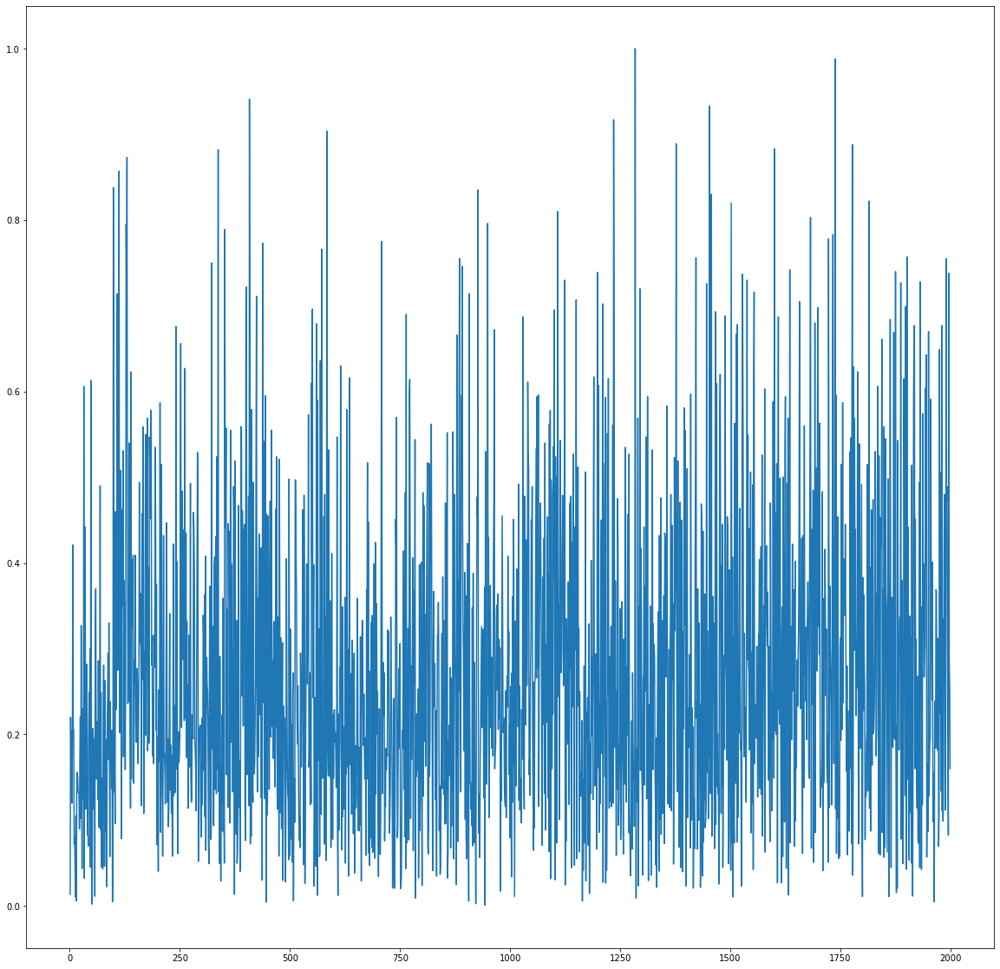

In [7]:
df['energy'].iloc[1:2000].plot(x = 'danceability',figsize = (20,20))

In [4]:
standardised_df = df.copy()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C7D7730DC8>]],
      dtype=object)

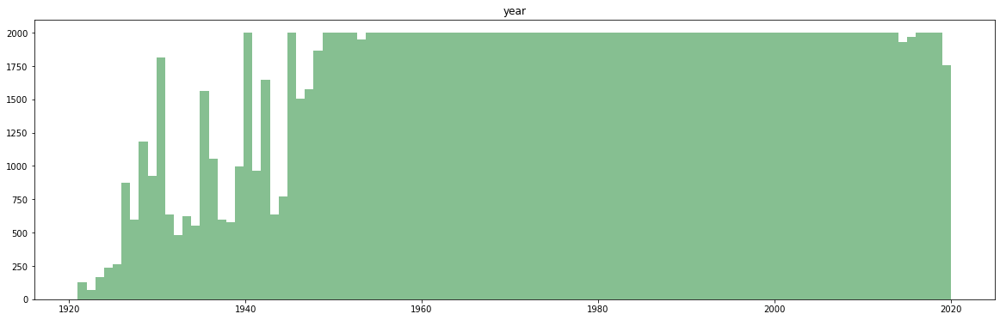

In [10]:
df.hist(column = 'year', bins = 100, grid = False,figsize = (20,6),color='#86bf91')

Standardization:

In [11]:
standardised_df[numeric_columns] = ((standardised_df[numeric_columns] - standardised_df[numeric_columns].mean())/(standardised_df[numeric_columns].std()))

normalization:

In [5]:
standardised_df[numeric_columns] = ((standardised_df[numeric_columns] - standardised_df[numeric_columns].min())/(standardised_df[numeric_columns].max()-standardised_df[numeric_columns].min()))

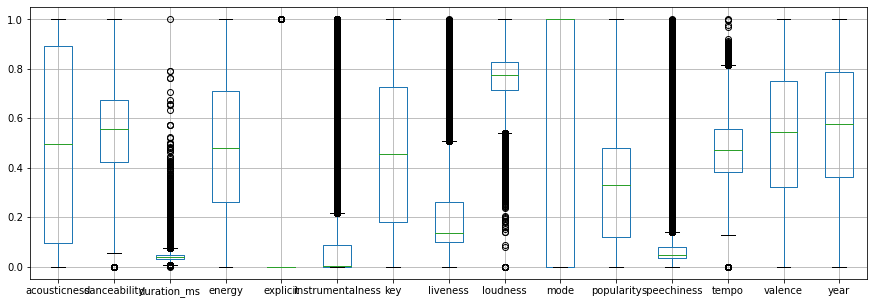

In [15]:
standardised_df[numeric_columns].boxplot(figsize = (15,5))

In [6]:
standardised_df = standardised_df[['name'] + [col for col in standardised_df if col!='name']]

In [18]:
sns.pairplot(df)

Error in callback <function flush_figures at 0x000001C7D5C7DF78> (for post_execute):


KeyboardInterrupt: 

In [7]:
standardised_df[numeric_columns].mean()

acousticness        0.495195
danceability        0.544686
duration_ms         0.041920
energy              0.488593
explicit            0.084863
instrumentalness    0.161937
key                 0.472774
liveness            0.206690
loudness            0.761565
mode                0.708556
popularity          0.315566
speechiness         0.097067
tempo               0.479116
valence             0.532095
year                0.567911
dtype: float64

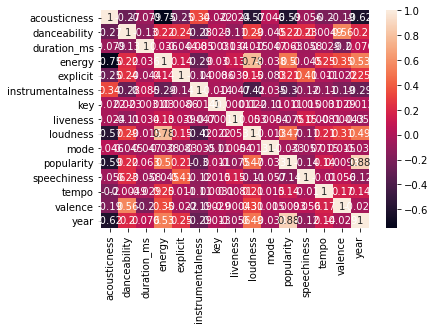

In [44]:
sns.heatmap(standardised_df.corr(),annot = True)

KNN for song classifier


In [33]:
from sklearn.metrics.pairwise import cosine_similarity,euclidean_distances

In [20]:
df.loc[(df['name'] == 'I Found You') & (df['artists'].str.find('Andy Grammer')>=0)]

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
126017,0.0945,['Andy Grammer'],0.728,151734,0.701,0,3CAqTfkRgmImhxYDjyL6S7,0.000021,1,0.181,-6.580,1,I Found You,74,2019-07-26,0.0406,137.970,0.413,2019
169907,0.0714,"['Cash Cash', 'Andy Grammer']",0.646,167308,0.761,0,3wYOGJYD31sLRmBgCvWxa4,0.000000,1,0.222,-2.557,1,I Found You,70,2020-02-28,0.0385,129.916,0.472,2020


In [59]:
def find_nearest_songs(stdf,song,artists,col_list,k):
    counted_columns = col_list.copy()
    song_details = stdf[(stdf['name'] == song) & (stdf['artists'].str.find(artists)>=0)][counted_columns]
    song_details['sameArtist'] = 0
    song_similarity_set = stdf[counted_columns].copy()
    song_similarity_set['sameArtist'] = np.where(stdf['artists'].str.find(artists)>=0,0,0)
    song_similarity_set['similarity'] = euclidean_distances(song_similarity_set.copy(),song_details)[:,0] 
    song_similarity_set[['name','id','artist','popularity']] = stdf[['name','id','artists','popularity']]
    song_similarity_set = song_similarity_set[['name'] + [col for col in song_similarity_set if col!='name']]
    song_similarity_set = song_similarity_set.sort_values(['similarity','popularity'], ascending = [True,False])
    similar_songs = song_similarity_set.iloc[:k,:]
    return similar_songs
    

In [60]:
columns_to_use = ['acousticness','danceability','energy','instrumentalness','valence','tempo','liveness','loudness','speechiness','year','key']

In [61]:
# counted_columns = ['acousticness','danceability','duration_ms','energy','instrumentalness','liveness','loudness','year','speechiness','tempo','valence']
find_nearest_songs(standardised_df,'Bohemian Rhapsody','Queen',columns_to_use,10)

,name,acousticness,danceability,energy,instrumentalness,valence,tempo,liveness,loudness,speechiness,year,key,sameArtist,similarity,id,artist,popularity
96343,Bohemian Rhapsody,0.272088,0.401822,0.386,0.000000,0.210,0.590935,0.1880,0.776682,0.051909,0.858586,0.0,0,0.000000,6l8GvAyoUZwWDgF1e4822w,['Queen'],0.60
125263,Bohemian Rhapsody - 2011 Mix,0.289157,0.396761,0.402,0.000000,0.228,0.589465,0.2430,0.783635,0.055315,0.909091,0.0,0,0.080838,2GAIycsMaDVtMtdvxzR2xI,['Queen'],0.54
151434,Still - Live,0.325301,0.390688,0.457,0.000000,0.166,0.572242,0.0956,0.833545,0.031063,0.848485,0.0,0,0.150299,7ndb8rYZXPCUDMfjyfieeU,['Hillsong Worship'],0.47
106918,Stone,0.243976,0.443320,0.477,0.000008,0.176,0.563909,0.1830,0.819842,0.031992,0.959596,0.0,0,0.158642,4rJesaufMl2xD0f2G8Xgnd,['Whiskey Myers'],0.63
76931,Distance and Time,0.379518,0.455466,0.434,0.002360,0.227,0.571688,0.1080,0.799436,0.030444,0.888889,0.0,0,0.160264,1fDm1kCj6dwmviArCtCsOA,['Alicia Keys'],0.48
114595,Let's Make Love,0.343373,0.366397,0.459,0.000000,0.158,0.602493,0.1110,0.804636,0.028277,0.787879,0.0,0,0.163620,0i0EezZjtGz0gsd8zBP7vR,"['Faith Hill', 'Tim McGraw']",0.50
69427,Take Your Time,0.378514,0.455466,0.356,0.000021,0.244,0.513608,0.1160,0.784715,0.031063,0.878788,0.0,0,0.168318,1pwy1QgUguLCykSAmLPMIQ,"['Al Green', 'Corinne Bailey Rae']",0.46
124889,Superwoman,0.268072,0.412955,0.494,0.002850,0.136,0.662450,0.1100,0.809788,0.049123,0.868687,0.0,0,0.172315,694V3efHIeLmVRZIDMGc4O,['Alicia Keys'],0.57
38676,Not About Love,0.165663,0.426113,0.416,0.000000,0.113,0.565834,0.1100,0.794675,0.033643,0.848485,0.0,0,0.172334,0WDARMlKHcDBm1r0PGaFCI,['Fiona Apple'],0.45
151370,Today My World Slipped Away,0.351406,0.432186,0.283,0.002070,0.185,0.557915,0.0923,0.762963,0.029618,0.838384,0.0,0,0.172608,0KrVVLD9ng1U9yv21SDPRi,['George Strait'],0.44


In [30]:
standardised_df.loc[standardised_df['artists'].str.find('Queen')>=0]


,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
3438,0.759036,['Queen'],0.345142,0.045218,0.293,0.0,2V0yBHMWB8GoMm80AXH4ot,0.000023,0.818182,0.0833,0.745314,1.0,Doing Alright - Remastered 2011,0.28,1973-07-13,0.036739,0.382210,0.178,0.525253
3459,0.253012,['Queen'],0.352227,0.047599,0.465,0.0,2CxcNZEY07i2MFruC6Pa1D,0.055900,0.363636,0.0695,0.672132,0.0,Some Day One Day,0.25,1974-03-08,0.035397,0.473688,0.748,0.535354
3461,0.087249,['Queen'],0.335020,0.071843,0.692,0.0,3meWD39fJLCiIFKV6TFzSL,0.000013,0.818182,0.6390,0.807392,0.0,The March Of The Black Queen - 2011 Mix,0.25,1974-03-08,0.077812,0.461398,0.141,0.535354
3465,0.371486,['Queen'],0.150810,0.068265,0.529,0.0,4nZlFMt8wPn4ylaAWtDnDL,0.000493,0.636364,0.1770,0.714525,1.0,Father To Son,0.25,1974-03-08,0.048916,0.639217,0.246,0.535354
3487,0.399598,['Queen'],0.287449,0.044895,0.733,0.0,5IP1hMVJkM3SjfUJmgC3Oy,0.000700,0.181818,0.7440,0.751515,1.0,Ogre Battle,0.24,1974-03-08,0.076471,0.450193,0.334,0.535354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168242,0.139558,['Ivy Queen'],0.856275,0.031570,0.905,0.0,4VKI2yBkCE4mWhFBwZp0LU,0.000010,0.545455,0.2280,0.881904,0.0,Quiero Saber,0.56,2004-01-27,0.060681,0.389273,0.843,0.838384
168307,0.022189,['Queen'],0.418016,0.037097,0.596,0.0,4o4kpehFSIvjFIGB36mGbm,0.000002,0.181818,0.3720,0.788521,1.0,Fat Bottomed Girls - Remastered,0.42,2004,0.050671,0.360882,0.549,0.838384
168368,0.163655,['Queens of the Stone Age'],0.472672,0.038940,0.827,0.0,7yyif2Ity1GipUXTdgofKw,0.728000,0.181818,0.3590,0.871161,1.0,Burn The Witch,0.46,2005-01-01,0.102890,0.513120,0.411,0.848485
168563,0.241968,['Queens of the Stone Age'],0.407895,0.038831,0.988,0.0,2jahbbMfa8GsYFhwBOBYMC,0.000785,0.454545,0.5530,0.886587,1.0,"Sick, Sick, Sick",0.46,2007-01-01,0.110423,0.790762,0.139,0.868687


In [47]:
numeric_columns.drop('key',)

Index(['acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity',
       'speechiness', 'tempo', 'valence', 'year'],
      dtype='object')